In [ ]:
import cv2

def generate_dataset():
    face_classifier = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")

    def face_cropped(img):
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_classifier.detectMultiScale(gray, 1.3, 5)

        if len(faces) == 0:
            return None

        for (x, y, h, w) in faces:
            cropped_face = img[y:y+h, x:x+w]
        return cropped_face

    cap = cv2.VideoCapture(0)
    img_id = 0

    while True:
        ret, frame = cap.read()
        if face_cropped(frame) is not None:
            img_id += 1
            face = cv2.resize(face_cropped(frame), (200, 200))
            face = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
            file_name_path = "data1/Gomini." + str(img_id) + ".jpg"
            cv2.imwrite(file_name_path, face)
            cv2.putText(face, str(img_id), (50, 50), cv2.FONT_HERSHEY_COMPLEX, 1, (0, 255, 0), 2)

            cv2.imshow("Cropped_Face", face)
            if cv2.waitKey(1) == 13 or int(img_id) == 1000:
                break

    cap.release()
    cv2.destroyAllWindows()
    print("Done")

generate_dataset()


In [1]:
import cv2 as c
import os
import random
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from random import shuffle
from tqdm import tqdm
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D,MaxPool2D,Dense,Flatten

In [2]:
train = ImageDataGenerator(rescale=1/255)
validation = ImageDataGenerator(rescale=1/255)


In [3]:
train_dataset = train.flow_from_directory("data",
                                          target_size=(150, 150),
                                          batch_size=3,
                                          class_mode='categorical')

val_dataset = train.flow_from_directory("data",
                                        target_size=(150, 150),
                                        batch_size=3,
                                        class_mode='categorical')

Found 11838 images belonging to 12 classes.
Found 11838 images belonging to 12 classes.


In [4]:
train = ImageDataGenerator(rescale=1/255)
val = ImageDataGenerator(rescale=1/255)

In [5]:
train_dataset.class_indices

{'Furqan': 0,
 'Gokul': 1,
 'Gomini': 2,
 'Hakim': 3,
 'Naveen': 4,
 'Paramesh G': 5,
 'Prathyusha': 6,
 'Sarfaraz': 7,
 'Tahiyya': 8,
 'anusha': 9,
 'soujanya': 10,
 'vignesh': 11}

In [6]:
train_dataset.classes

array([ 0,  0,  0, ..., 11, 11, 11])

In [7]:
#training the model
model=Sequential([
    Conv2D(16,(3,3),activation='relu',input_shape=(150,150,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
    
])

In [8]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [9]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Define the model architecture
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(12, activation='softmax')) #12 is the no of classes

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Set the path to your data directory
base_path = "C:/Users/Vignesh/A/"

# Set the image dimensions and other hyperparameters
pic_size = 150
batch_size = 20
epochs = 12

# Load and preprocess your training data using ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # Set appropriate preprocessing steps

train_generator = train_datagen.flow_from_directory(
    base_path + "data/",
    target_size=(pic_size, pic_size),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    base_path + "data/",
    target_size=(pic_size, pic_size),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Fit the model using the generators
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.n // train_generator.batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=validation_generator.n // validation_generator.batch_size
)

# Save the trained model
model.save("train_model.h5")


Found 9475 images belonging to 12 classes.
Found 2363 images belonging to 12 classes.
Epoch 1/12
473/473 [==============================] - 239s 505ms/step - loss: 0.2038 - accuracy: 0.9360 - val_loss: 0.1274 - val_accuracy: 0.9640
Epoch 2/12
473/473 [==============================] - 232s 490ms/step - loss: 0.0217 - accuracy: 0.9944 - val_loss: 0.0655 - val_accuracy: 0.9835
Epoch 3/12
473/473 [==============================] - 225s 476ms/step - loss: 0.0123 - accuracy: 0.9967 - val_loss: 0.1216 - val_accuracy: 0.9750
Epoch 4/12
473/473 [==============================] - 258s 545ms/step - loss: 0.0100 - accuracy: 0.9974 - val_loss: 0.1139 - val_accuracy: 0.9852
Epoch 5/12
473/473 [==============================] - 257s 544ms/step - loss: 0.0097 - accuracy: 0.9977 - val_loss: 0.0750 - val_accuracy: 0.9881
Epoch 6/12
473/473 [==============================] - 234s 494ms/step - loss: 5.8184e-04 - accuracy: 0.9999 - val_loss: 0.0871 - val_accuracy: 0.9852
Epoch 7/12
473/473 [==============

In [ ]:
model.save("train_model.h5")

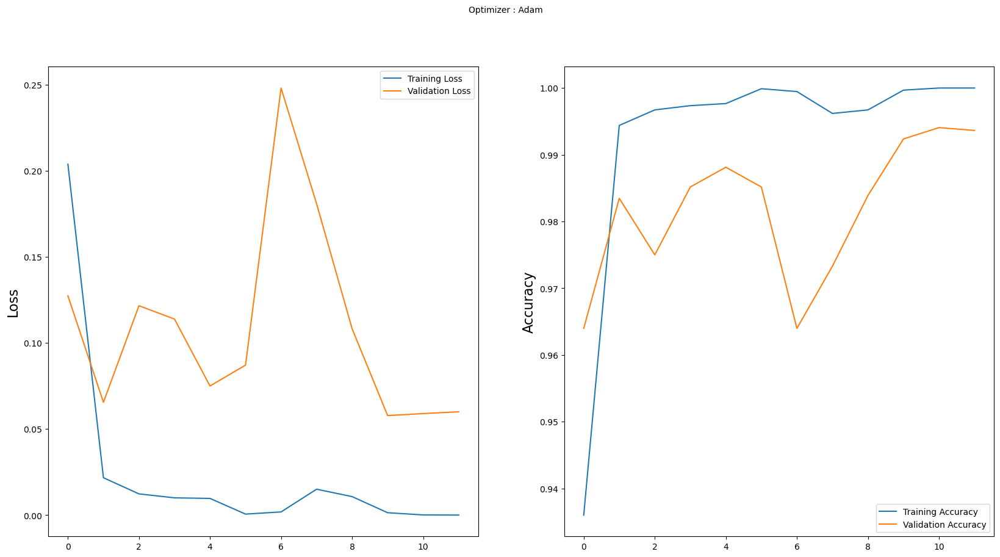

In [10]:
import matplotlib.pyplot as plt

 



plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
plt.suptitle('Optimizer : Adam', fontsize=10)
plt.ylabel('Loss', fontsize=16)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')

plt.subplot(1, 2, 2)
plt.ylabel('Accuracy', fontsize=16)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.show()

In [11]:
import seaborn as sns

import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [12]:
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix
import itertools
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator

# Load the saved model
model = load_model('train_model.h5')
base_path="C:/Users/Vignesh/A/"
# Number of classes in your training data
num_classes = 12  #12 is the no of classes

# Load and preprocess your testing data using ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    base_path + "test/",
    target_size=(pic_size, pic_size),
    batch_size=batch_size,
    class_mode='categorical',  # Ensure one-hot encoding of labels
    shuffle=False  # Make sure to set shuffle to False
)

# Check if there are any images in the test directory
if test_generator.samples == 0:
    print("No images found in the test directory.")
else:
    # Get predictions from the model
    predictions = model.predict_generator(generator=test_generator)
    y_pred = np.argmax(predictions, axis=1)
    y_test = test_generator.classes
    class_names = list(test_generator.class_indices.keys())

    # Compute accuracy
    testing_accuracy = accuracy_score(y_test, y_pred) * 100
    print("TESTING ACCURACY:", testing_accuracy)

    # Compute confusion matrix
    cnf_matrix = confusion_matrix(y_test, y_pred)
    np.set_printoptions(precision=2)

    # Plot normalized confusion matrix
    def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        plt.figure(figsize=(10, 10))
        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = '.2f'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()

    # Plot confusion matrix
    plt.figure()
    plot_confusion_matrix(cnf_matrix, classes=class_names, title='Normalized confusion matrix')
    plt.show()


Found 0 images belonging to 0 classes.
No images found in the test directory.


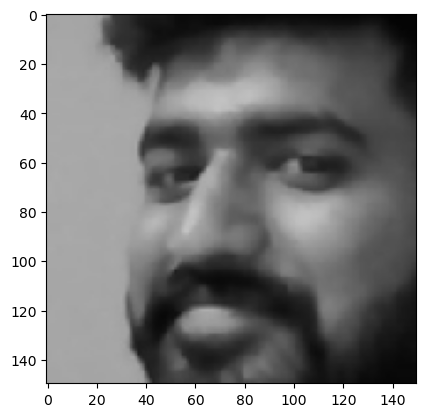

1/1 [==============================] - 0s 107ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


In [13]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('train_model.h5')

# Load and preprocess the image
img = image.load_img('66.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.,0.,0.,0.,0.,0.]]):
    print("anusha")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.,0.,0.,0.,0.,0.]]):
    print("Furqan")    
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.,0.,0.,0.,0.,0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.,0.,0.,0.,0.,0.]]):
    print("Gomini") 
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.,0.,0.,0.,0.,0.]]):
    print("Hakim")    
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.,0.,0.,0.,0.,0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.,0.,0.,0.,0.,0.]]):
    print("Paramesh G")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0.,1.,0.,0.,0.,0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0.,0.,1.,0.,0.,0.]]):
    print("Sarfaraz")    
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0.,0.,0.,1.,0.,0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0.,0.,0.,0.,1.,0.]]):
    print("Tahiyya")    
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0.,0.,0.,0.,0.,1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


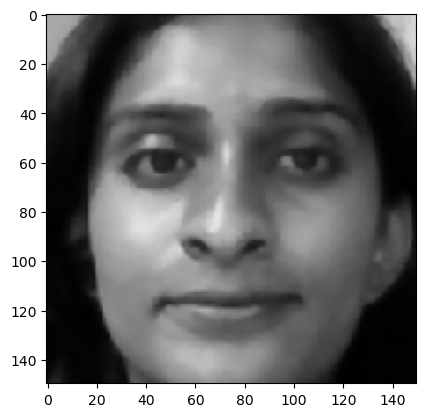

1/1 [==============================] - 0s 60ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


In [39]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('25.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


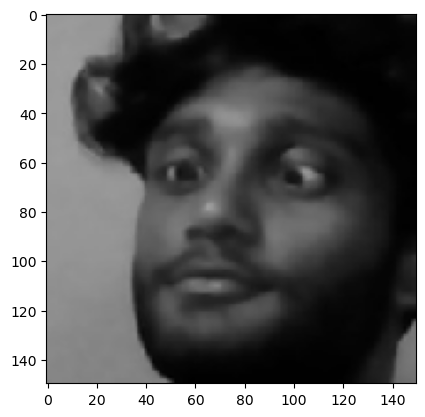

1/1 [==============================] - 0s 71ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


In [40]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('Gokul.13.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


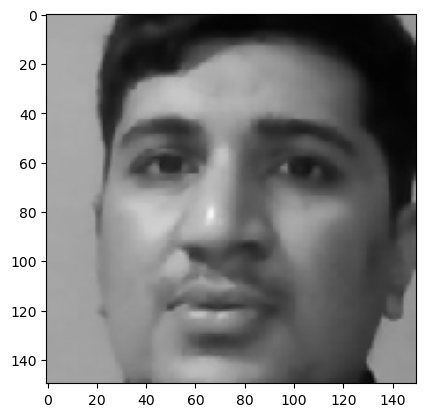

1/1 [==============================] - 0s 63ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


In [41]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('62.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


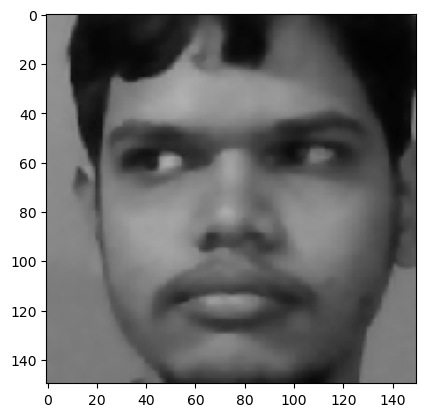

1/1 [==============================] - 0s 62ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


In [42]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('72.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


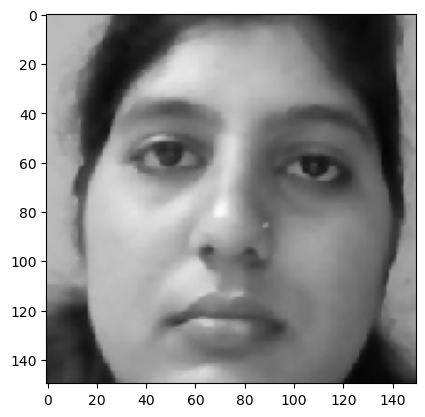

1/1 [==============================] - 0s 69ms/step
[[0. 0. 0. 0. 0. 1. 0.]]
Soujanya


In [43]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('55.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


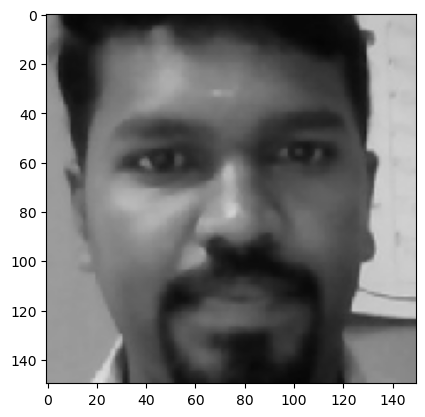

1/1 [==============================] - 0s 56ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


In [44]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Load and preprocess the image
img = image.load_img('Paramesh G.13.jpg', target_size=(150, 150))
x = image.img_to_array(img)
plt.imshow(img)
plt.show()
x = np.expand_dims(x, axis=0)
images = np.vstack([x])

# Make predictions
y_pred = model.predict(images)
print(y_pred)

# Process the predictions
if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
    print("Furquan")
elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
    print("Gokul")
elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
    print("Naveen")
elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
    print("Paramesh")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
    print("Prathyusha")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
    print("Soujanya")
elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
    print("Vignesh")
else:
    print("Data Not Found!!!")


In [14]:
def data_for_visualization():
    Vdata = []
    for img in tqdm(os.listdir("test")):
        path = os.path.join("test", img)
        img_num = img.split('.')[0]
        img_data = c.imread(path, c.IMREAD_GRAYSCALE)
        img_data = c.resize(img_data, (50,50))
        Vdata.append([np.array(img_data),img_num])
    shuffle(Vdata)
    return Vdata

In [15]:
Vdata = data_for_visualization()

100%|████████████████████████████████████████████████████████████████████████████████| 92/92 [00:00<00:00, 1146.97it/s]


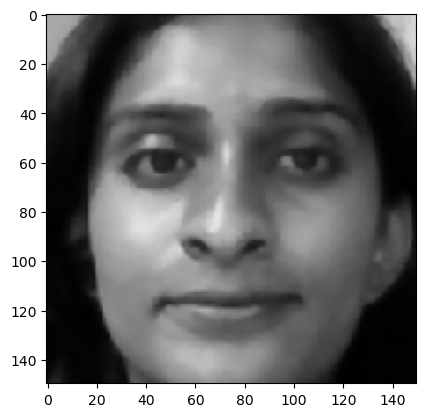

1/1 [==============================] - 0s 66ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


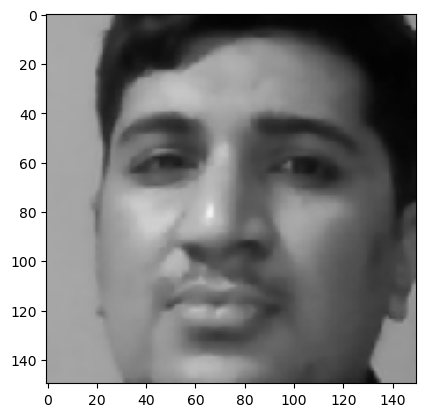

1/1 [==============================] - 0s 30ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


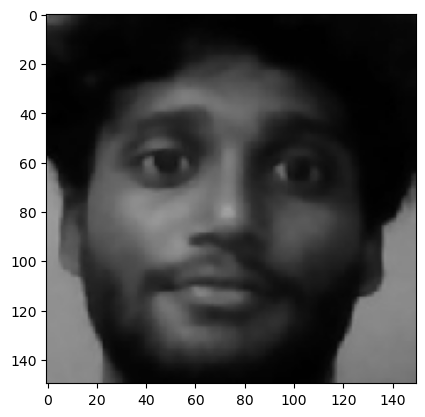

1/1 [==============================] - 0s 23ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


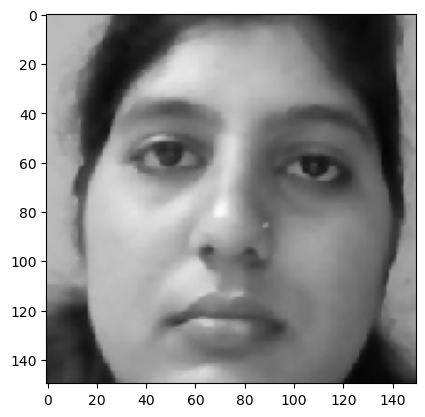

1/1 [==============================] - 0s 25ms/step
[[0. 0. 0. 0. 0. 1. 0.]]
Soujanya


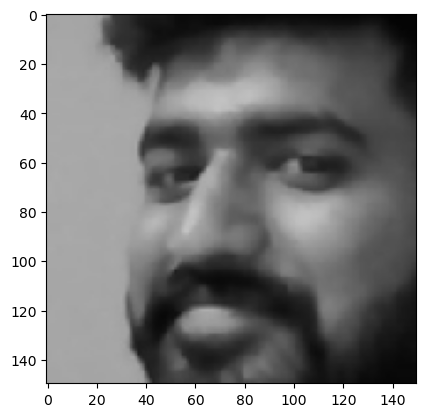

1/1 [==============================] - 0s 33ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


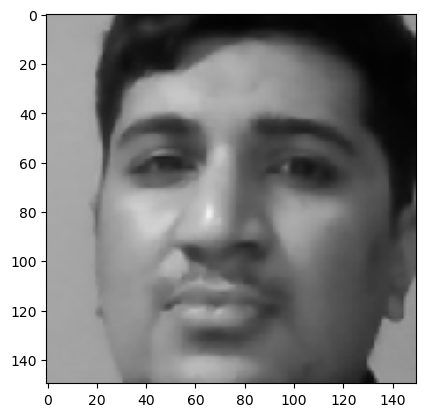

1/1 [==============================] - 0s 23ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


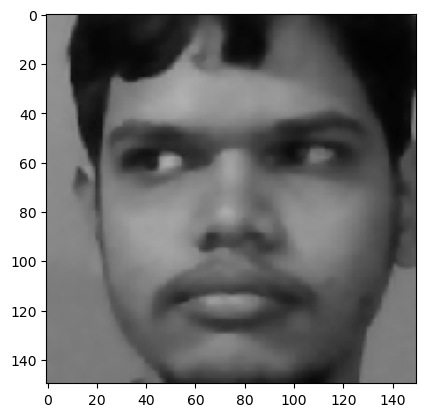

1/1 [==============================] - 0s 24ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


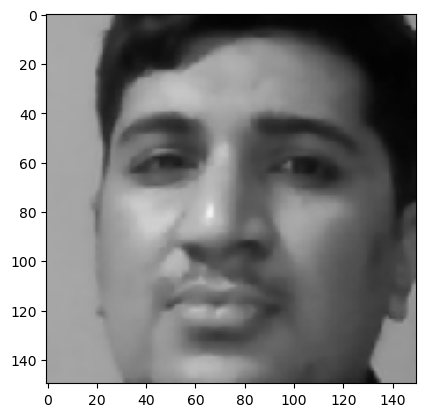

1/1 [==============================] - 0s 28ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


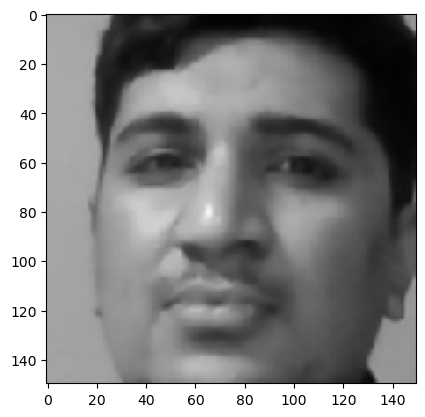

1/1 [==============================] - 0s 34ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


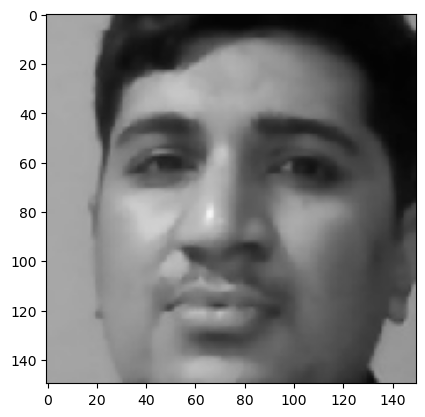

1/1 [==============================] - 0s 29ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


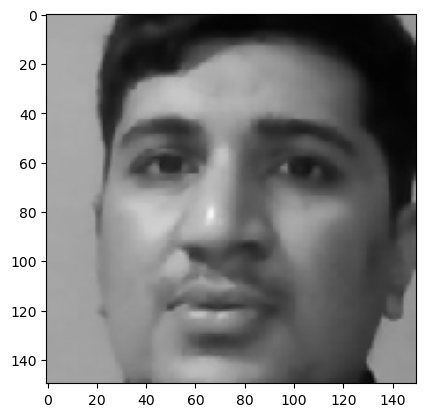

1/1 [==============================] - 0s 29ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


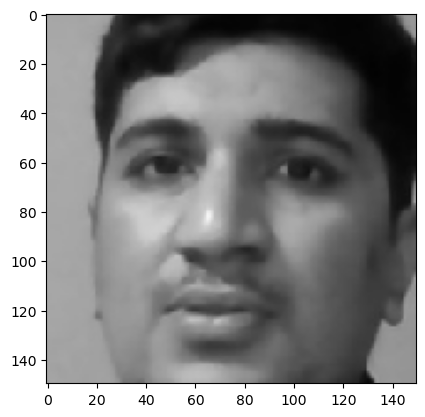

1/1 [==============================] - 0s 28ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


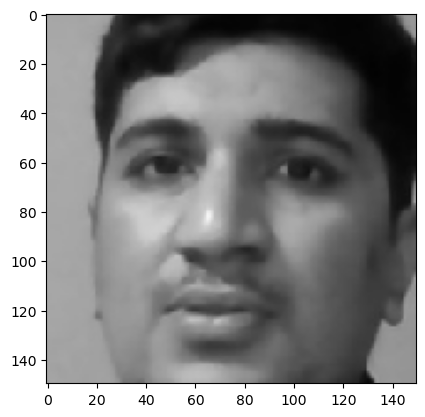

1/1 [==============================] - 0s 14ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


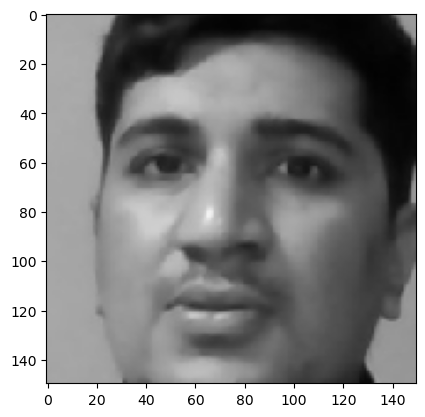

1/1 [==============================] - 0s 17ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


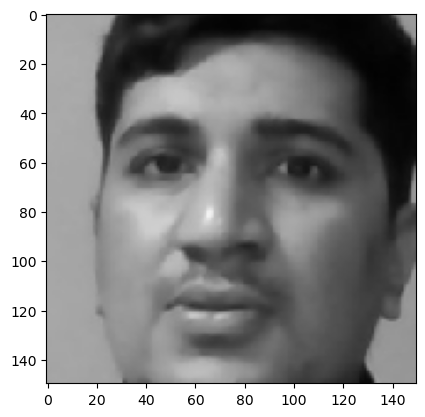

1/1 [==============================] - 0s 34ms/step
[[1. 0. 0. 0. 0. 0. 0.]]
Furquan


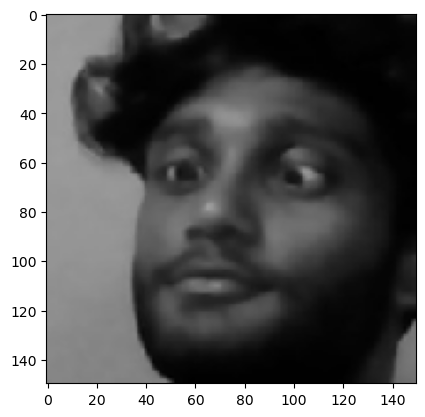

1/1 [==============================] - 0s 26ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


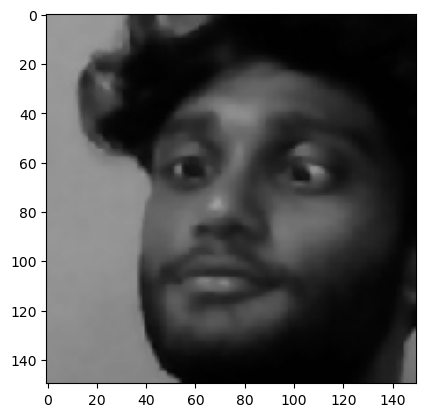

1/1 [==============================] - 0s 33ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


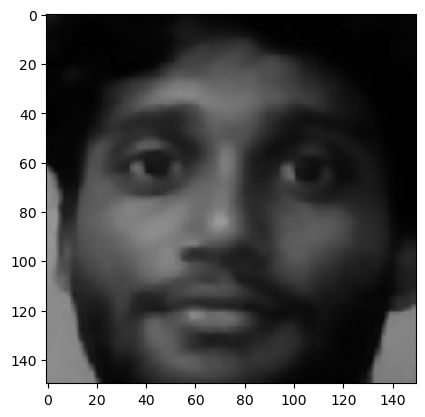

1/1 [==============================] - 0s 23ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


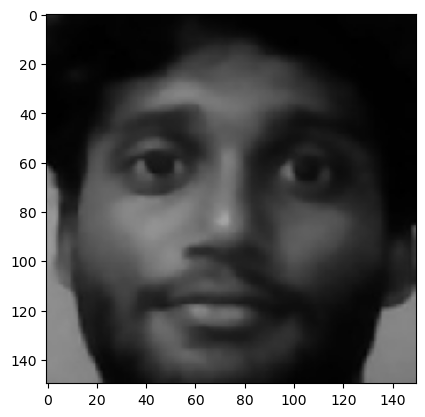

1/1 [==============================] - 0s 31ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


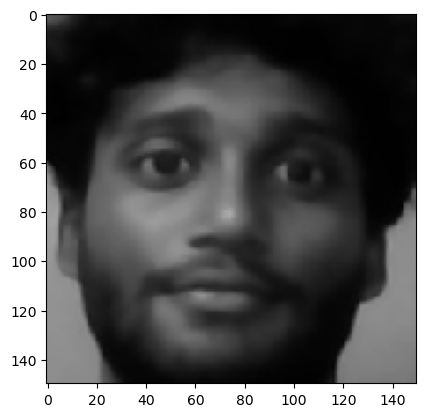

1/1 [==============================] - 0s 22ms/step
[[0. 1. 0. 0. 0. 0. 0.]]
Gokul


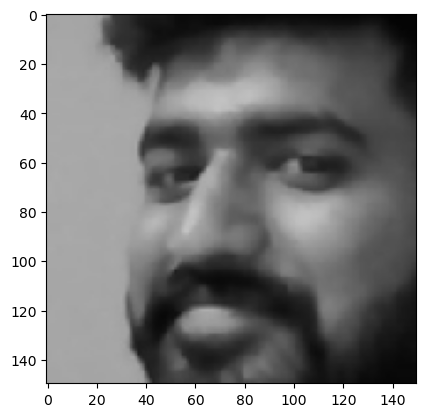

1/1 [==============================] - 0s 19ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


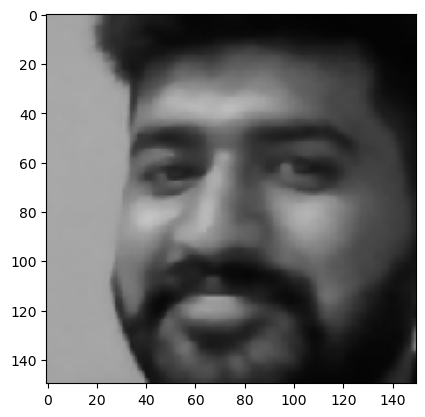

1/1 [==============================] - 0s 23ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


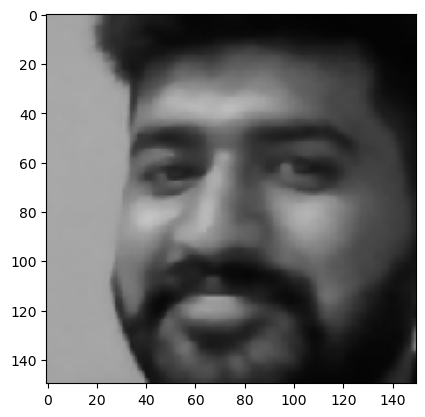

1/1 [==============================] - 0s 34ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


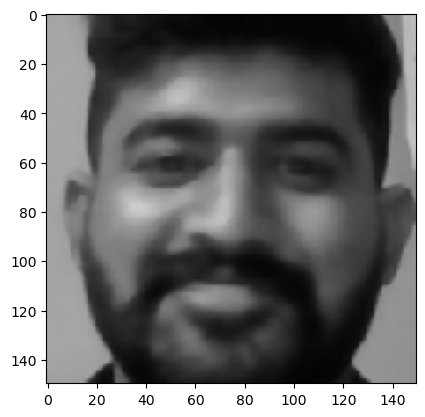

1/1 [==============================] - 0s 17ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


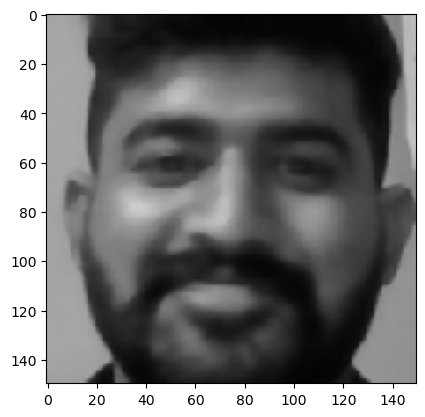

1/1 [==============================] - 0s 28ms/step
[[0. 0. 1. 0. 0. 0. 0.]]
Naveen


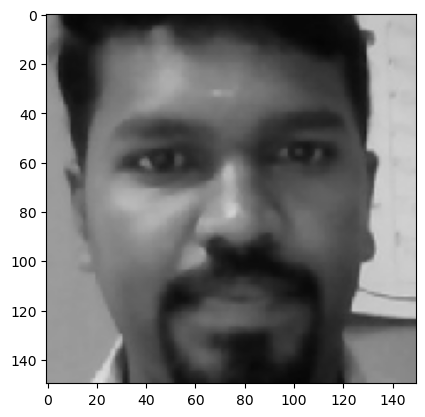

1/1 [==============================] - 0s 26ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


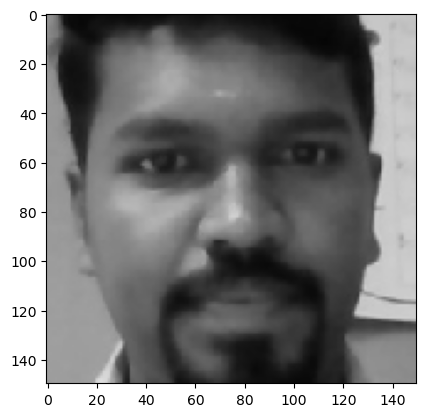

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


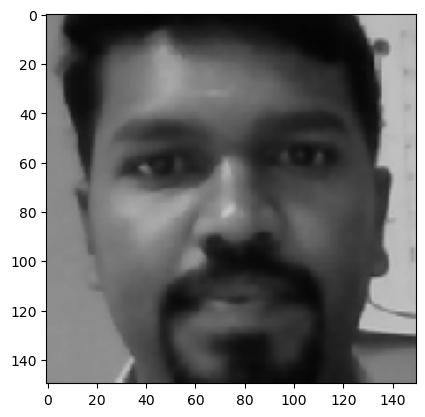

1/1 [==============================] - 0s 27ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


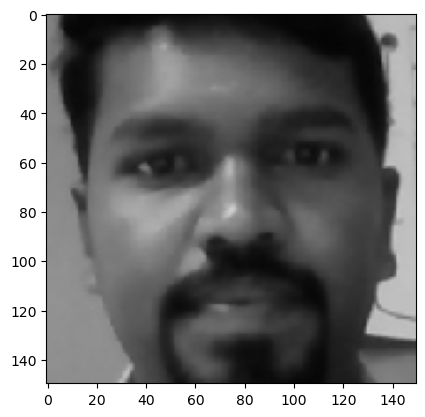

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


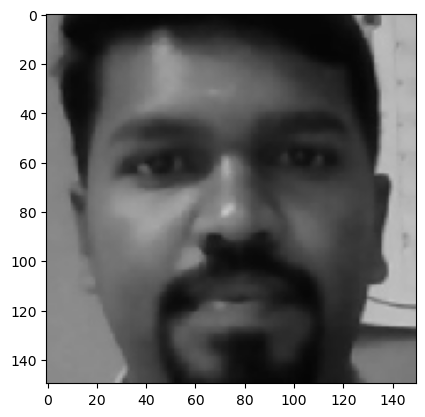

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


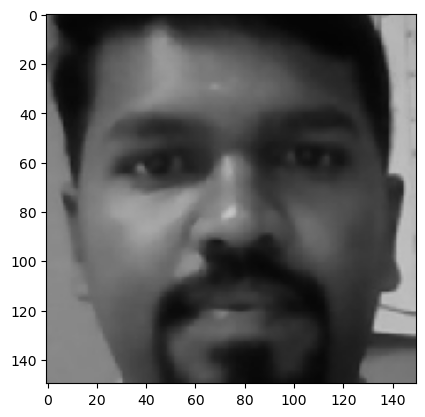

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 1. 0. 0. 0.]]
Paramesh


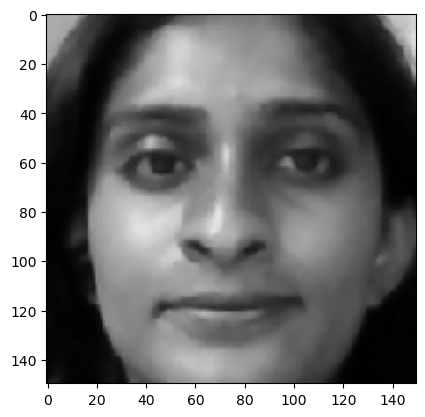

1/1 [==============================] - 0s 11ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


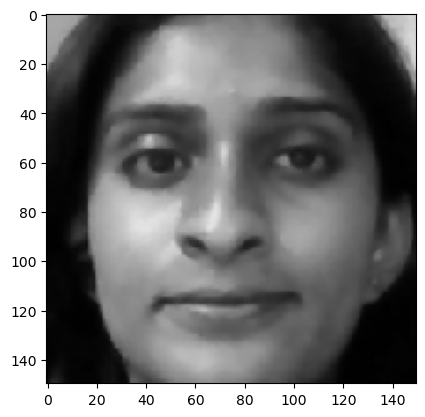

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


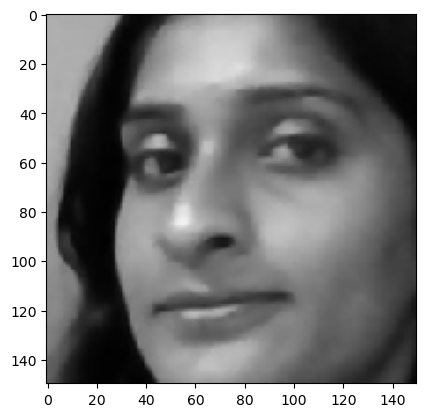

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


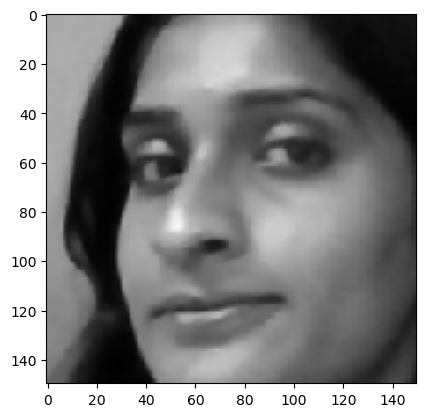

1/1 [==============================] - 0s 18ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


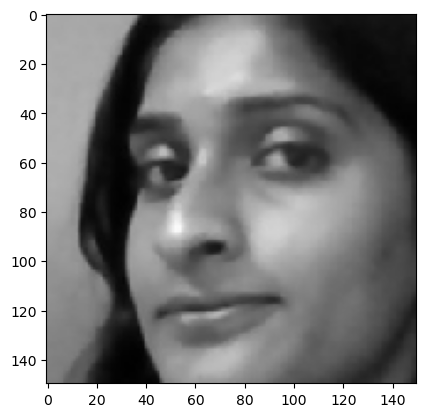

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 1. 0. 0.]]
Prathyusha


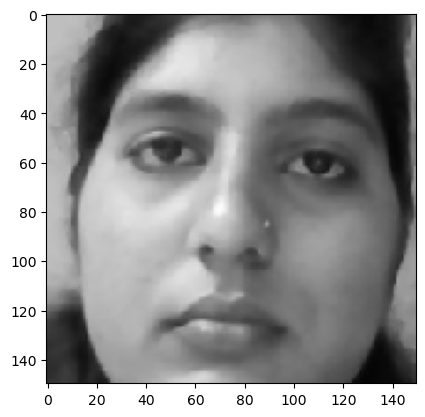

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 1. 0.]]
Soujanya


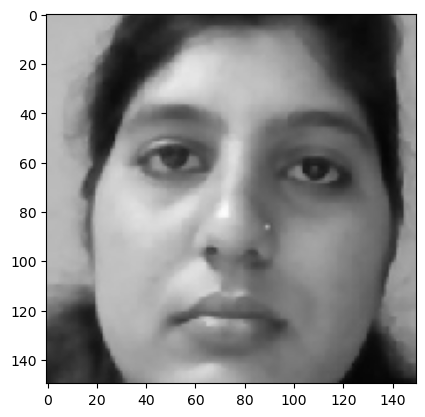

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 1. 0.]]
Soujanya


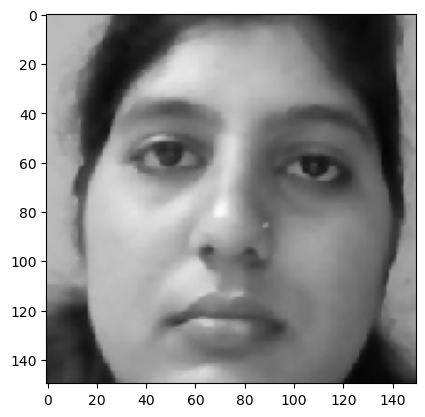

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 1. 0.]]
Soujanya


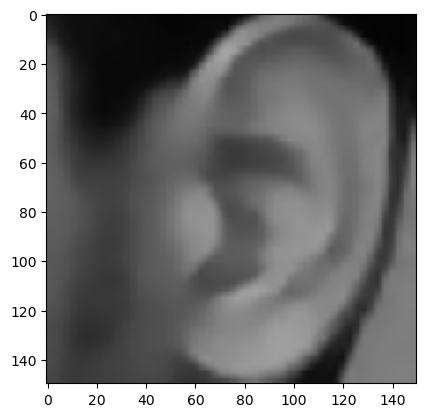

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


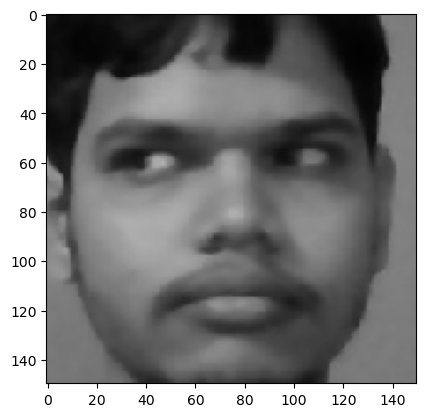

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


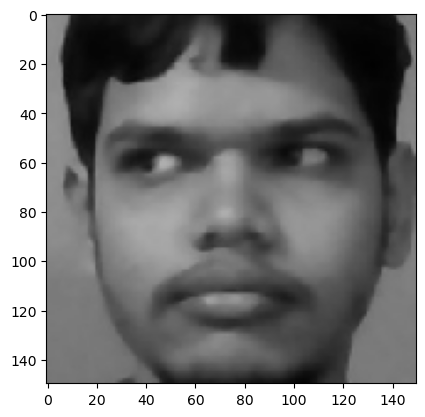

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


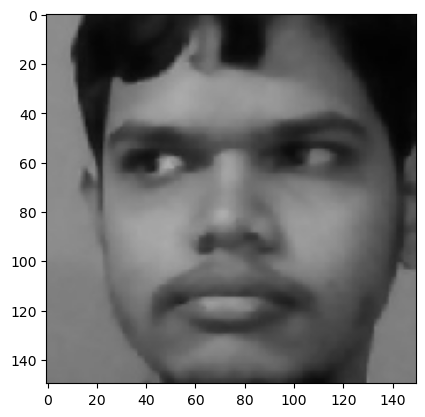

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


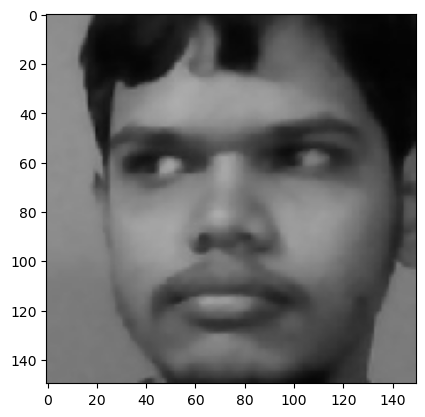

1/1 [==============================] - 0s 35ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


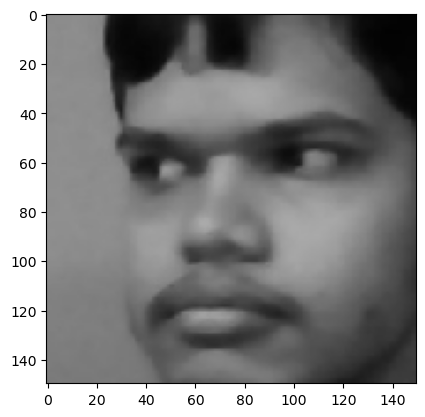

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


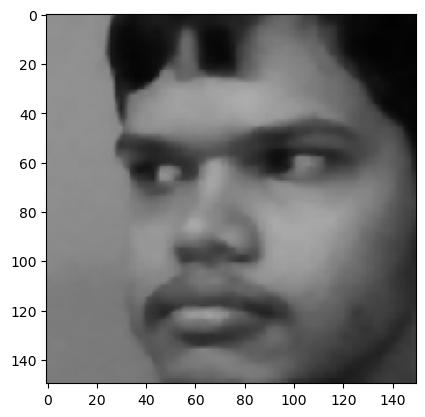

1/1 [==============================] - 0s 31ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


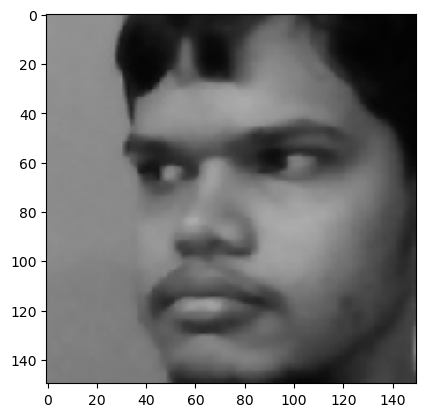

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


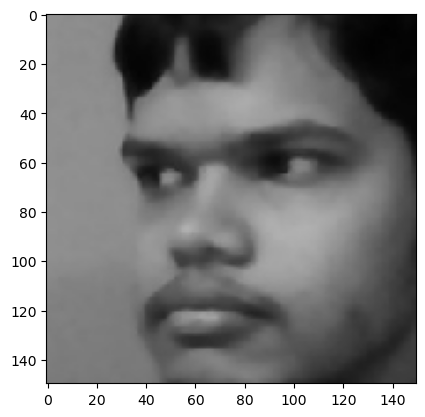

1/1 [==============================] - 0s 25ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


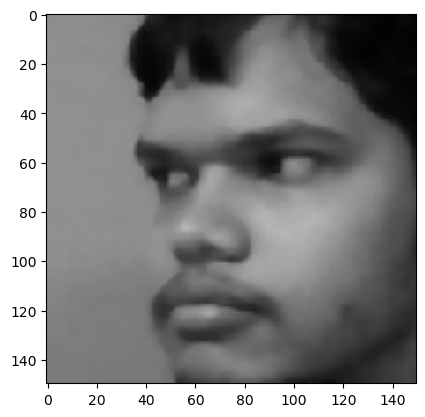

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


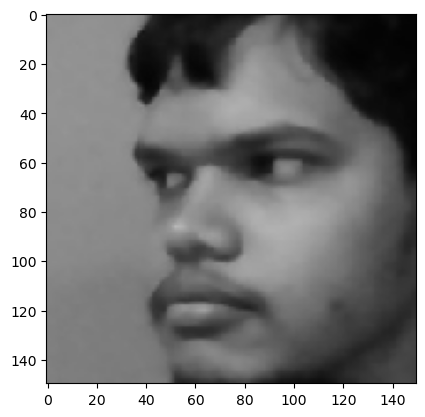

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


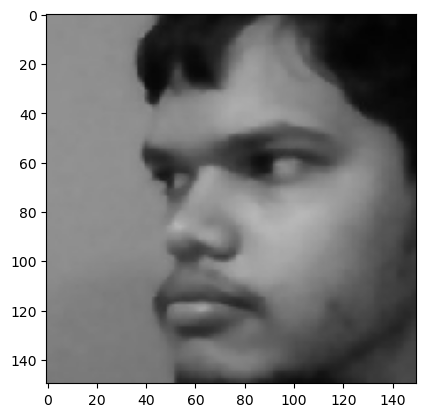

1/1 [==============================] - 0s 17ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


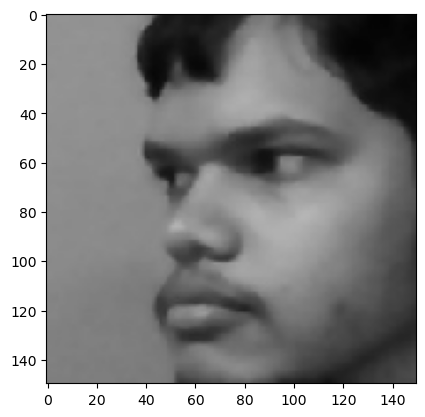

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


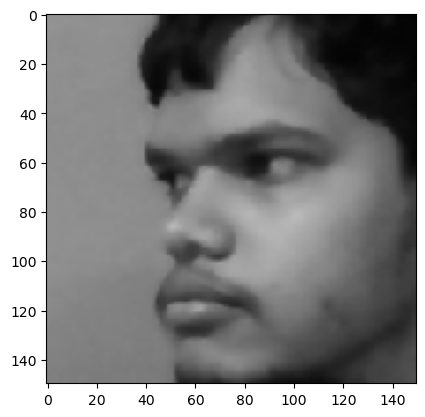

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


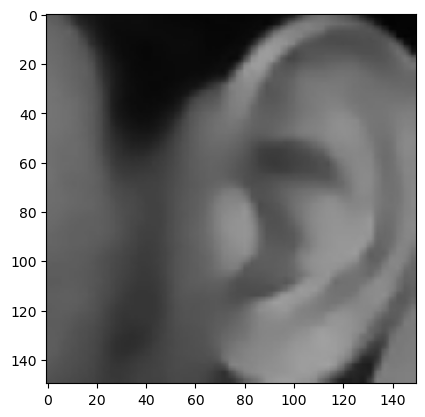

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 1.]]
Vignesh


In [61]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Path to the image folder
folder_path = 'test'

# Iterate over the image files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load and preprocess the image
        img_path = os.path.join(folder_path, filename)
        img = image.load_img(img_path, target_size=(150, 150))
        x = image.img_to_array(img)
        plt.imshow(img)
        plt.show()
        x = np.expand_dims(x, axis=0)
        images = np.vstack([x])

        # Make predictions
        y_pred = model.predict(images)
        print(y_pred)

        # Process the predictions
        if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
            print("Furquan")
        elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
            print("Gokul")
        elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
            print("Naveen")
        elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
            print("Paramesh")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
            print("Prathyusha")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
            print("Soujanya")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
            print("Vignesh")
        else:
            print("Data Not Found!!!")


In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Open video capture
cap = cv2.VideoCapture(0)

while True:
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Preprocess the frame
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, (150, 150))  # Resize the image
    x = image.img_to_array(img)
    plt.imshow(img)
    plt.show()
    x = np.expand_dims(x, axis=0)
    images = np.vstack([x])

    # Make predictions
    y_pred = model.predict(images)
    print(y_pred)

    # Process the predictions
    if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0.]]):
        print("Furquan")
    elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0.]]):
        print("Gokul")
    elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0.]]):
        print("Naveen")
    elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0.]]):
        print("Paramesh")
    elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0.]]):
        print("Prathyusha")
    elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0.]]):
        print("Soujanya")
    elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1.]]):
        print("Vignesh")
    else:
        print("Data Not Found!!!")

    # Break the loop if the 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture
cap.release()

# Destroy all windows
cv2.destroyAllWindows()


In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Define label names
label_names = {
    0: "Furquan",
    1: "Gokul",
    2: "Naveen",
    3: "Paramesh",
    4: "Prathyusha",
    5: "Soujanya",
    6: "Vignesh"
}

# Load the model
model = tf.keras.models.load_model('trained_model.h5')

# Open video capture
cap = cv2.VideoCapture(0)

while True:
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Preprocess the frame
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img = cv2.resize(img, (150, 150))  # Resize the image
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    images = np.vstack([x])

    # Make predictions
    y_pred = model.predict(images)
    label_index = np.argmax(y_pred)
    label = label_names[label_index]

    # Draw bounding box and label
    h, w, _ = frame.shape
    cv2.rectangle(frame, (0, 0), (w, h), (0, 0, 255), 2)
    cv2.putText(frame, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, cv2.LINE_AA)

    # Display the frame
    cv2.imshow('Video', frame)

    # Break the loop if the 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release the video capture
cap.release()

# Destroy all windows
cv2.destroyAllWindows()


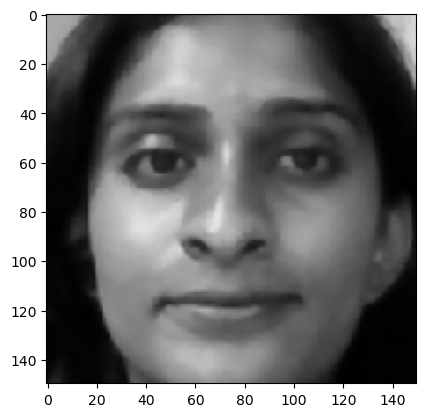

1/1 [==============================] - 0s 68ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


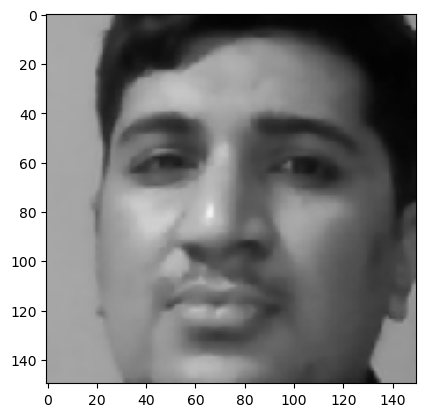

1/1 [==============================] - 0s 22ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


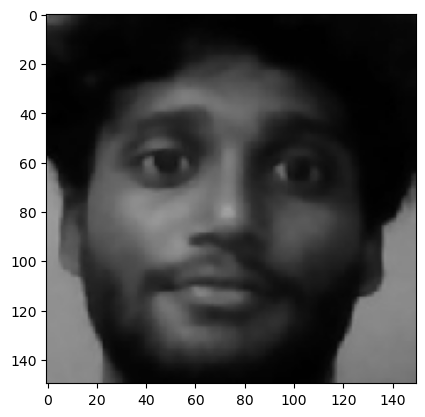

1/1 [==============================] - 0s 23ms/step
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Furqan


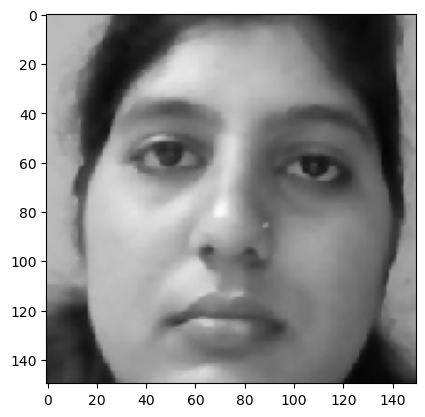

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Tahiyya


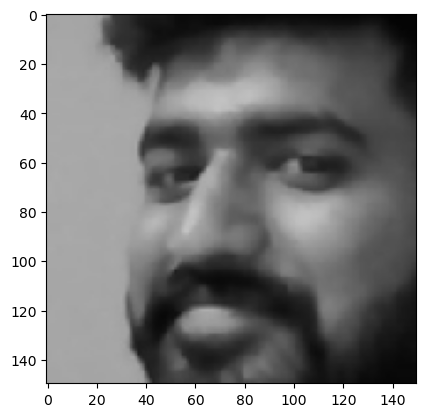

1/1 [==============================] - 0s 38ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


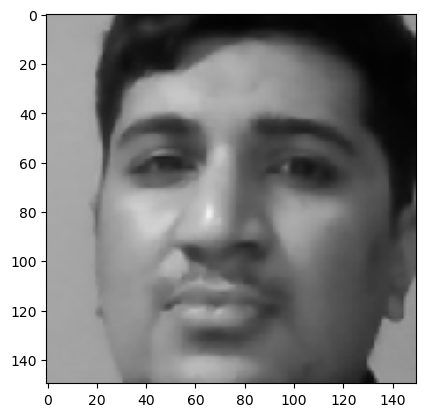

1/1 [==============================] - 0s 29ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


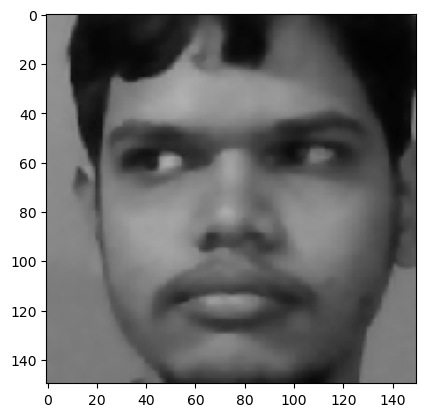

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


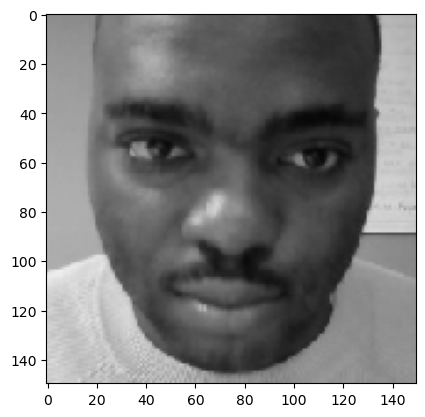

1/1 [==============================] - 0s 20ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


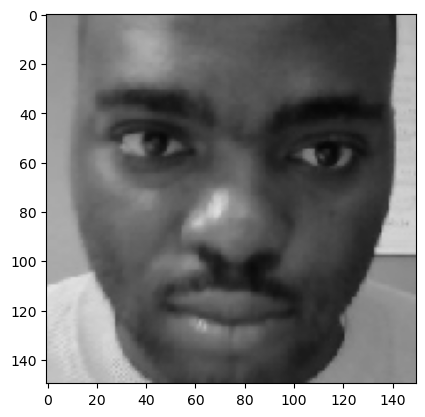

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


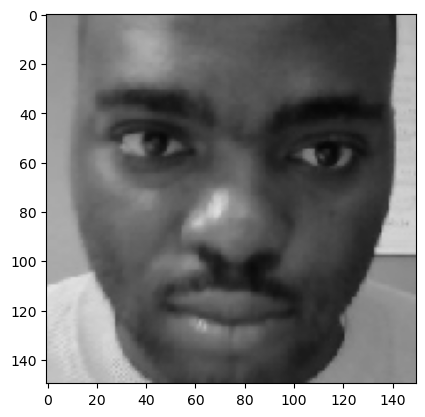

1/1 [==============================] - 0s 30ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


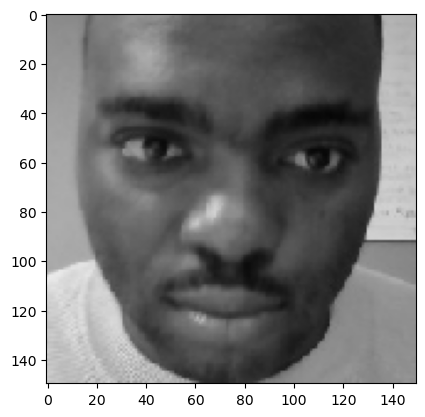

1/1 [==============================] - 0s 38ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


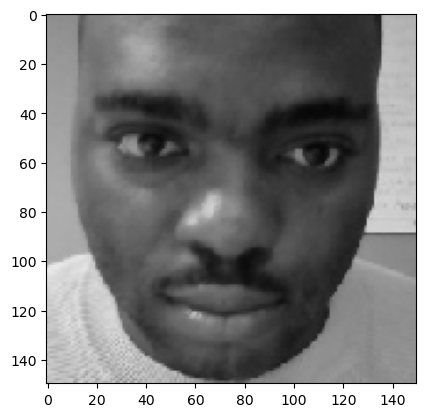

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


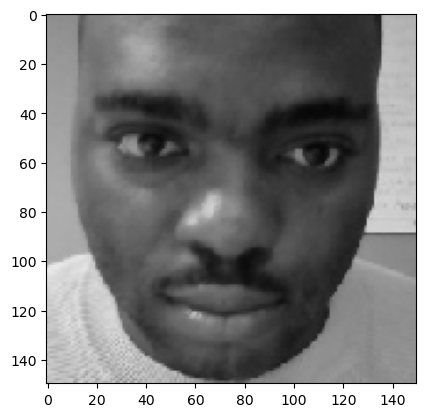

1/1 [==============================] - 0s 14ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


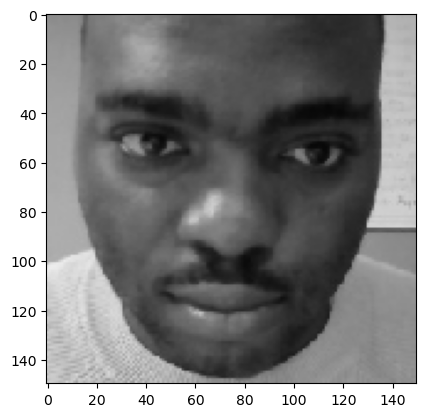

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


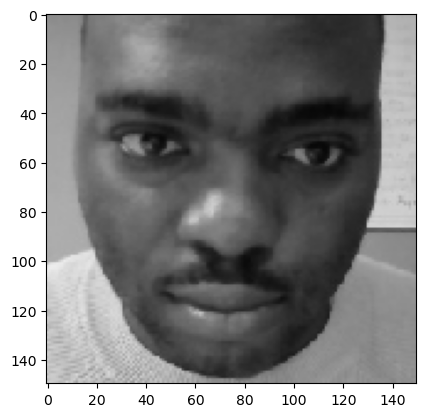

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gomini


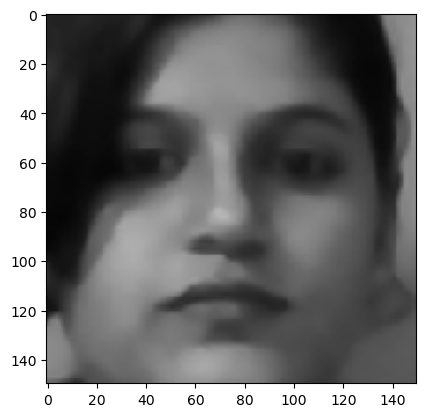

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


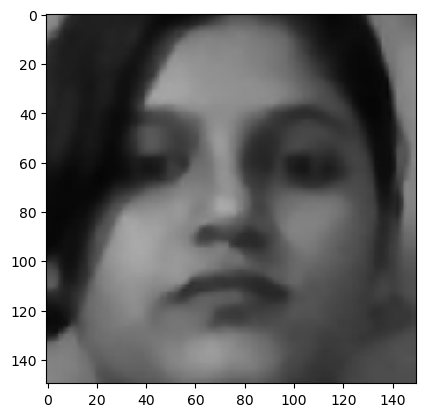

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


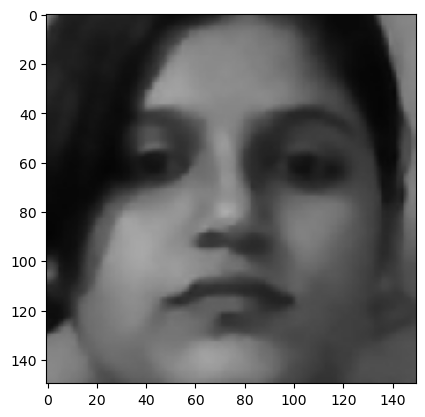

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


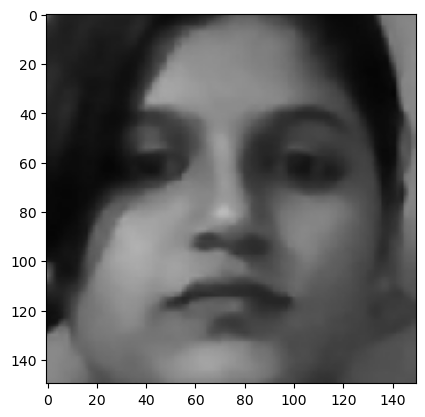

1/1 [==============================] - 0s 16ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


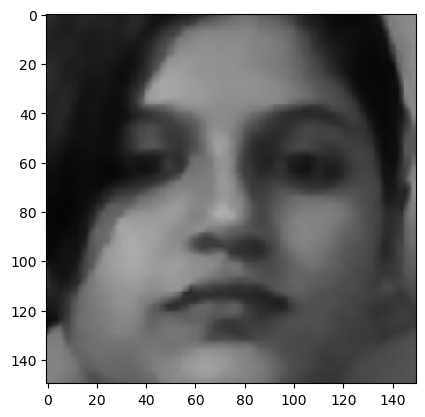

1/1 [==============================] - 0s 30ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


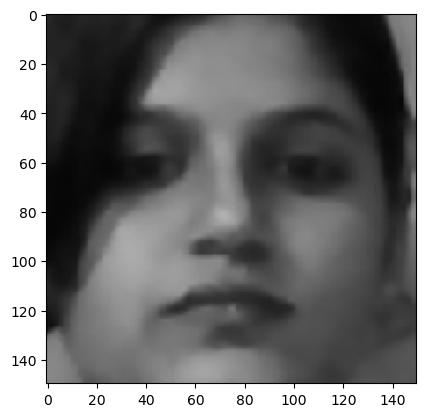

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


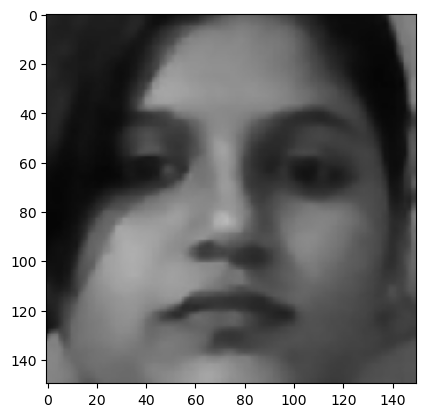

1/1 [==============================] - 0s 18ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


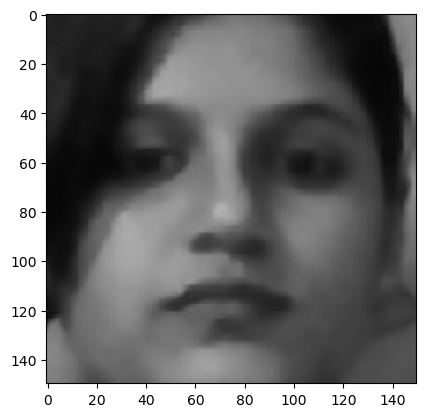

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]
Soujanya


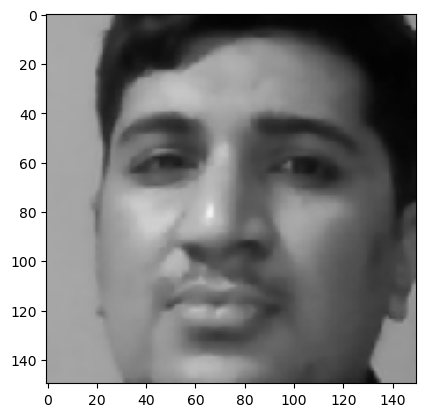

1/1 [==============================] - 0s 34ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


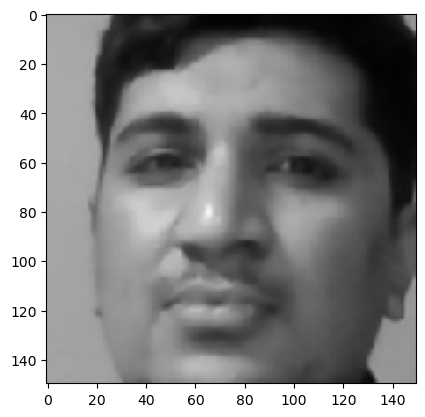

1/1 [==============================] - 0s 12ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


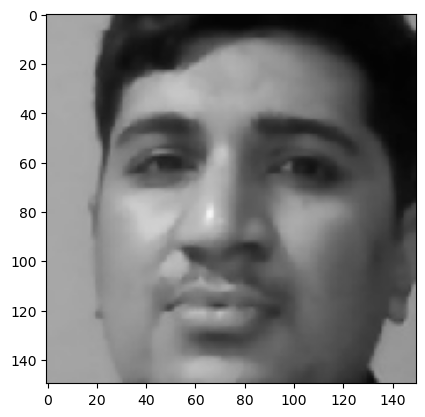

1/1 [==============================] - 0s 18ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


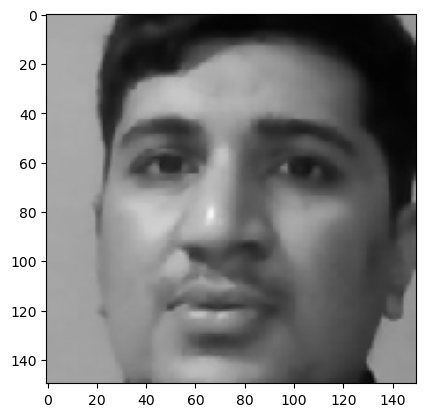

1/1 [==============================] - 0s 34ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


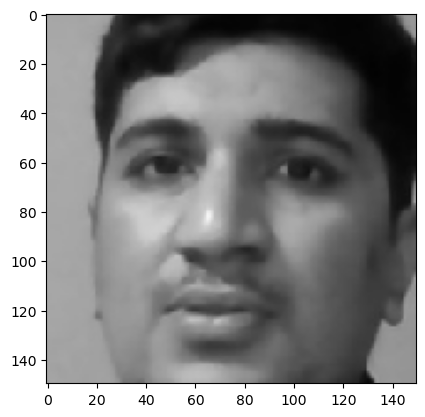

1/1 [==============================] - 0s 14ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


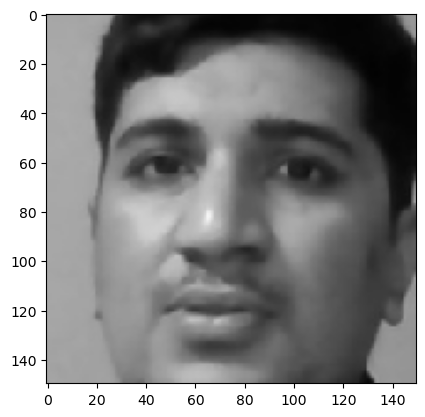

1/1 [==============================] - 0s 32ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


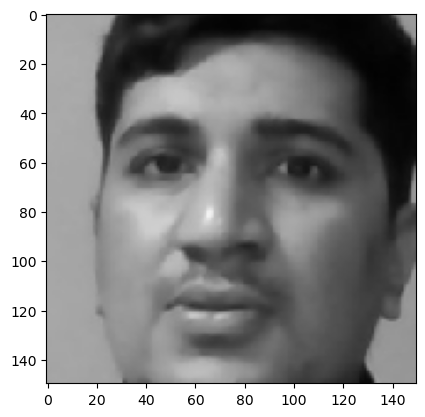

1/1 [==============================] - 0s 10ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


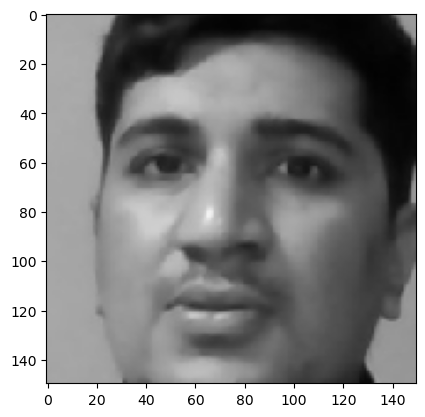

1/1 [==============================] - 0s 18ms/step
[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
anusha


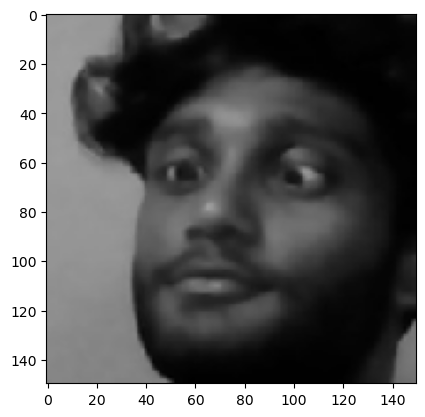

1/1 [==============================] - 0s 30ms/step
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Furqan


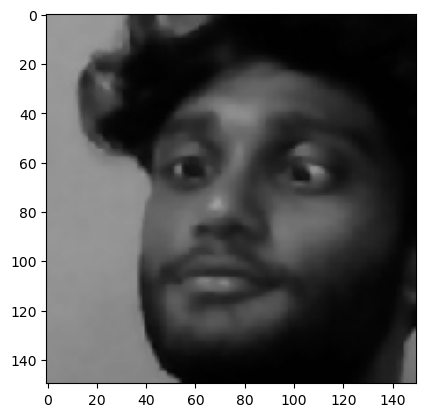

1/1 [==============================] - 0s 14ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


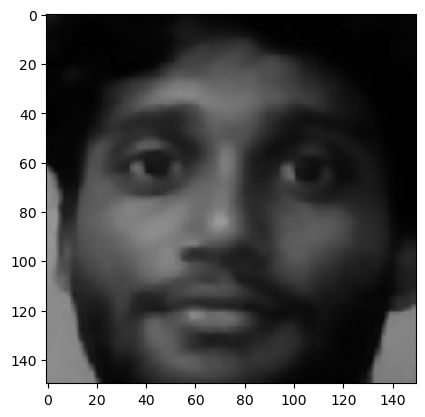

1/1 [==============================] - 0s 32ms/step
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Furqan


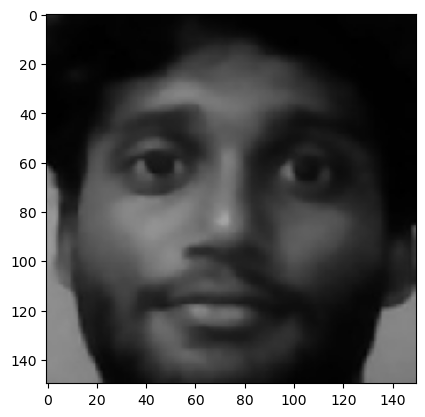

1/1 [==============================] - 0s 34ms/step
[[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Furqan


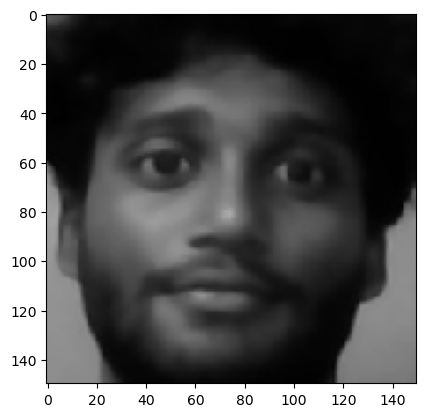

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


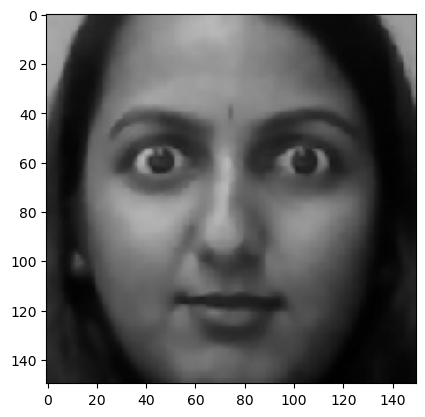

1/1 [==============================] - 0s 31ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


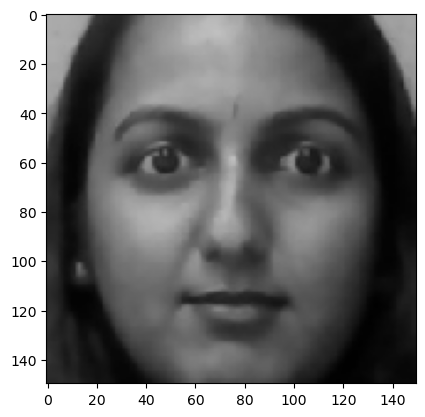

1/1 [==============================] - 0s 17ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


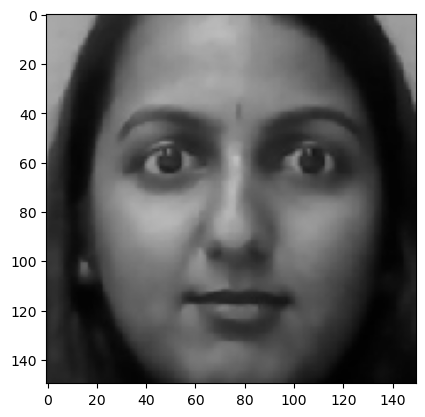

1/1 [==============================] - 0s 19ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


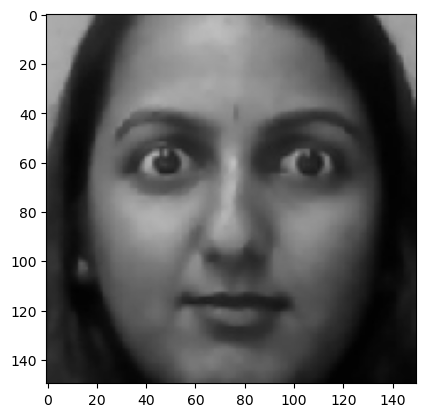

1/1 [==============================] - 0s 32ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


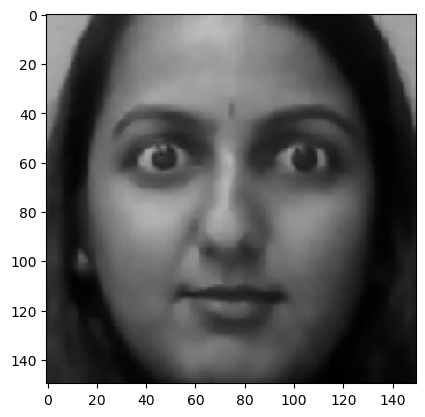

1/1 [==============================] - 0s 14ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


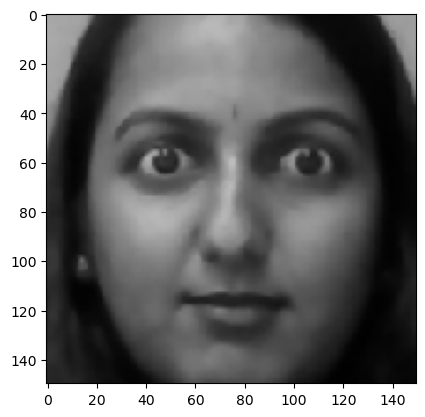

1/1 [==============================] - 0s 34ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


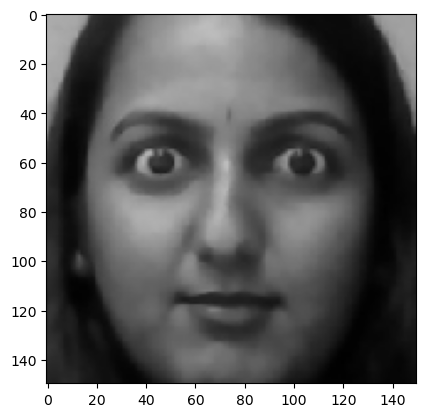

1/1 [==============================] - 0s 29ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


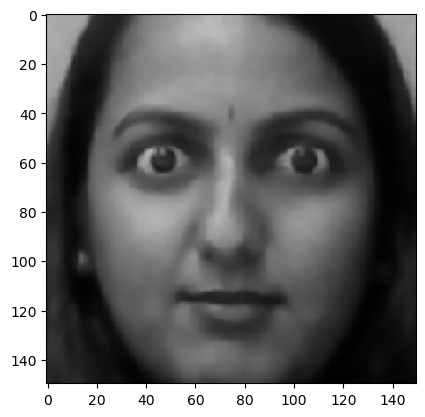

1/1 [==============================] - 0s 21ms/step
[[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Gokul


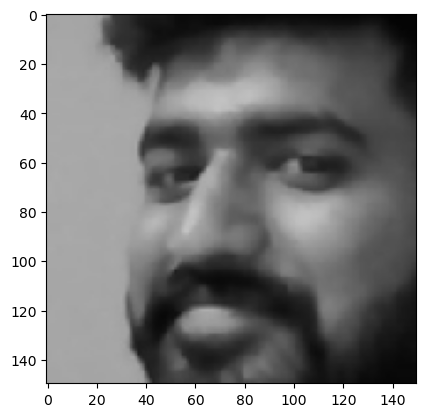

1/1 [==============================] - 0s 29ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


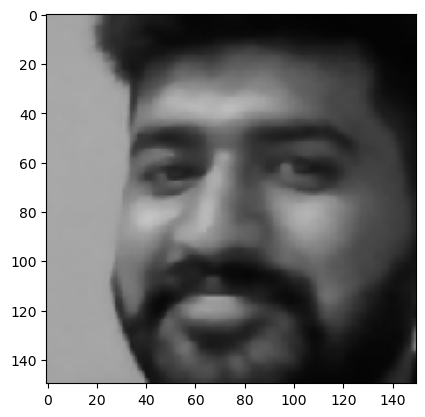

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


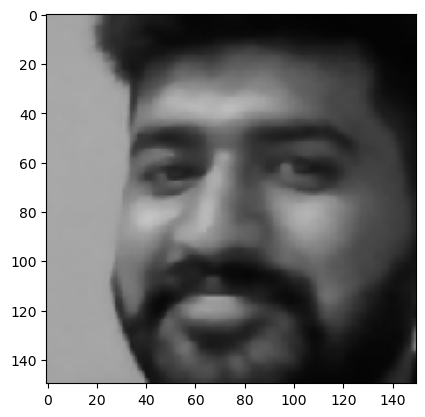

1/1 [==============================] - 0s 19ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


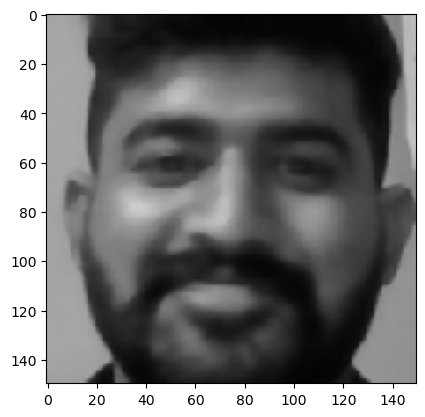

1/1 [==============================] - 0s 18ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


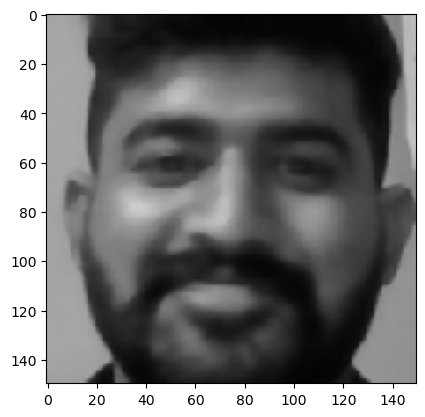

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]]
Hakim


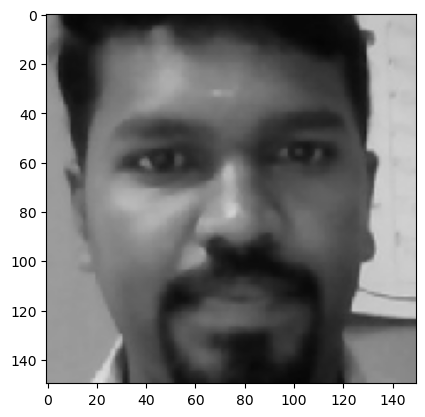

1/1 [==============================] - 0s 32ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


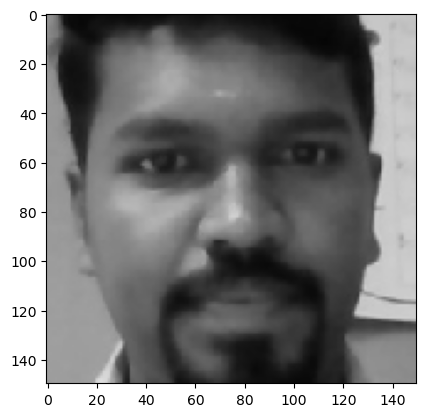

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


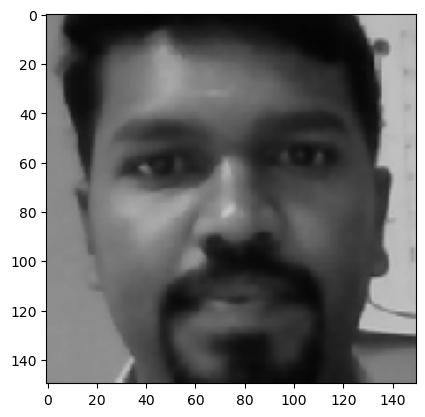

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


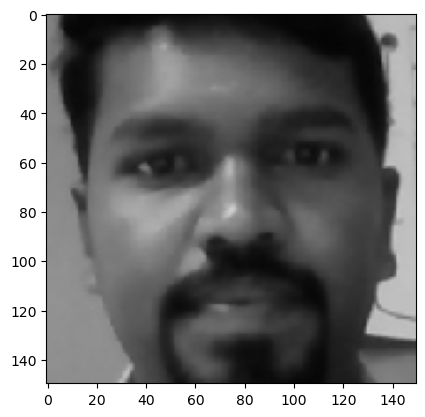

1/1 [==============================] - 0s 30ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


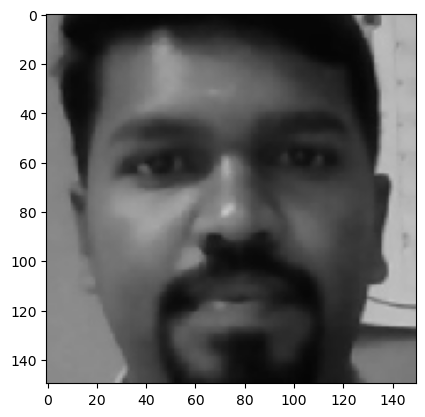

1/1 [==============================] - 0s 29ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


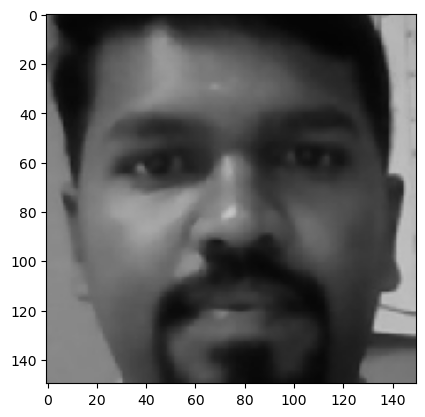

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]
Naveen


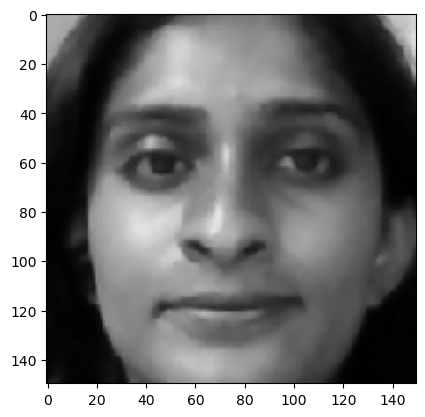

1/1 [==============================] - 0s 27ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


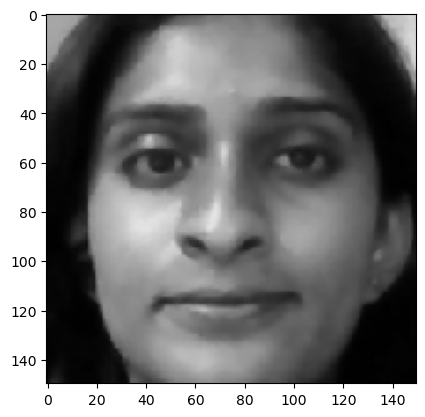

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


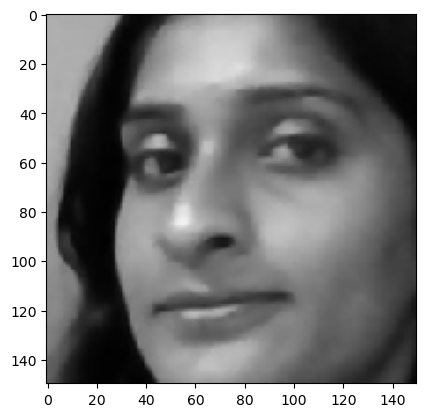

1/1 [==============================] - 0s 24ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


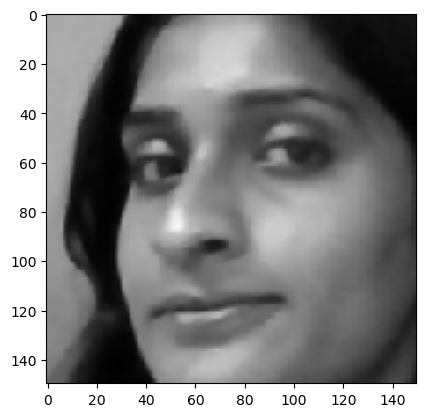

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


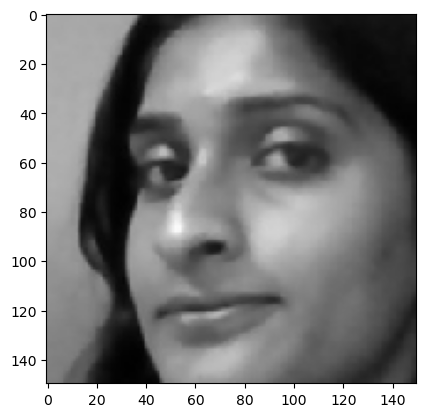

1/1 [==============================] - 0s 31ms/step
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]
Paramesh G


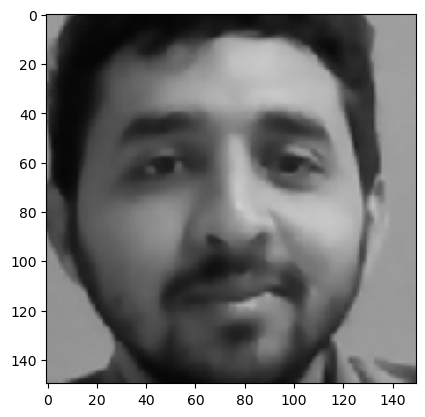

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


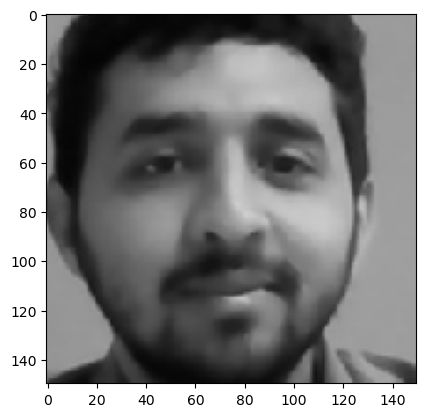

1/1 [==============================] - 0s 25ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


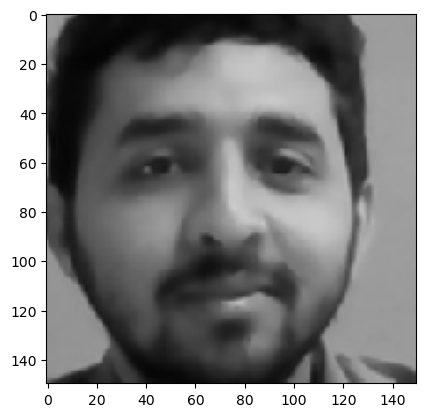

1/1 [==============================] - 0s 27ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


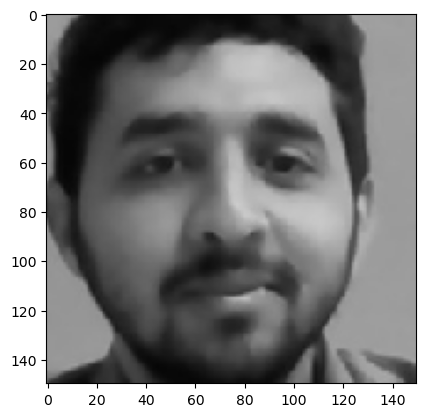

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


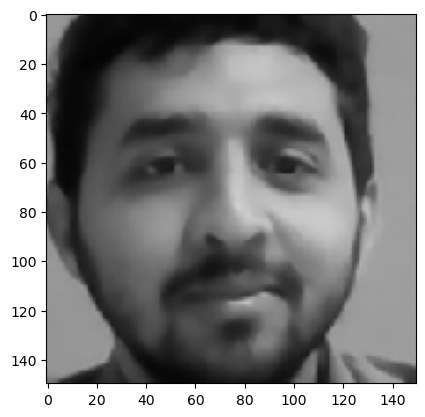

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


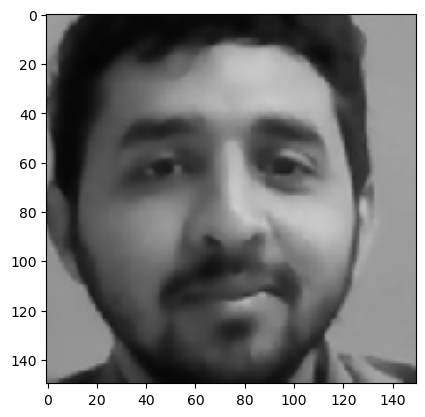

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


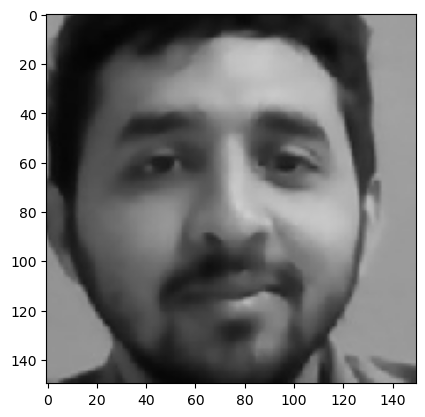

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


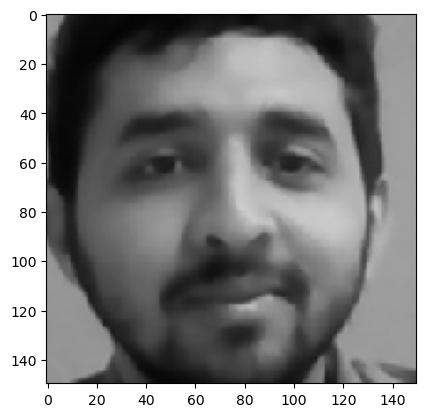

1/1 [==============================] - 0s 26ms/step
[[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]
Prathyusha


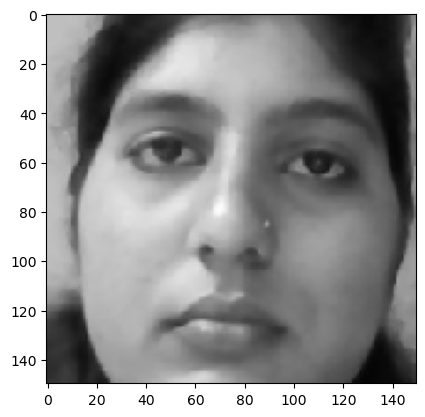

1/1 [==============================] - 0s 28ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Tahiyya


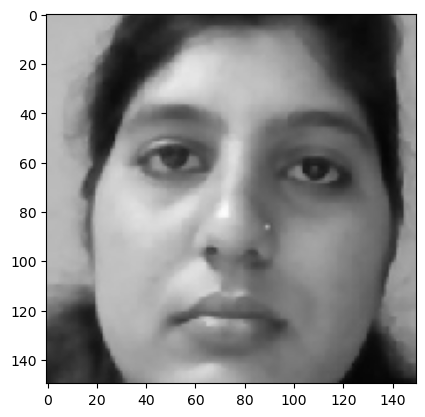

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Tahiyya


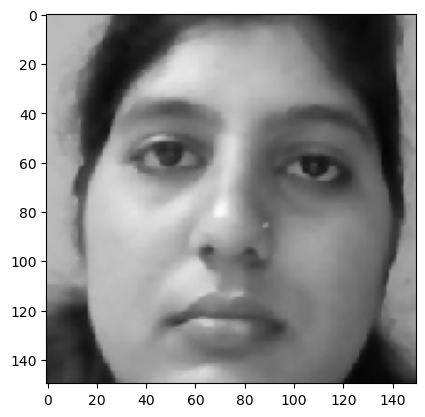

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
Tahiyya


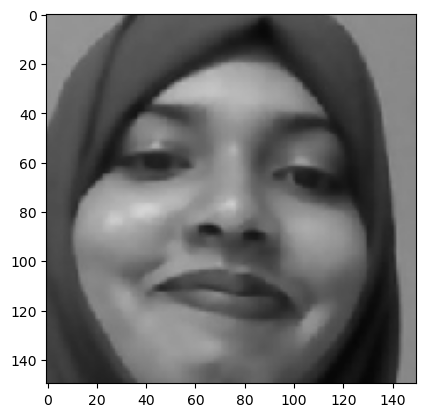

1/1 [==============================] - 0s 37ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


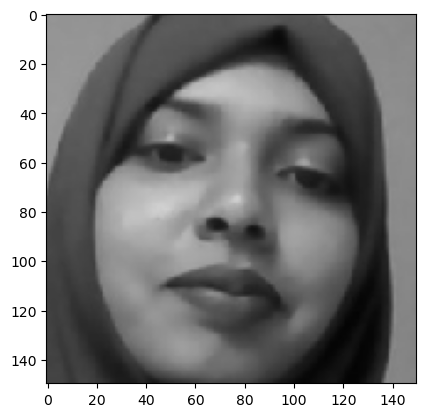

1/1 [==============================] - 0s 21ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


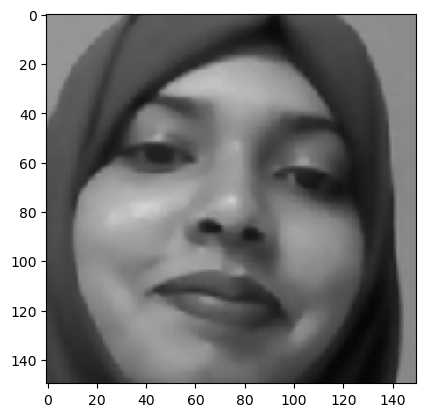

1/1 [==============================] - 0s 26ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


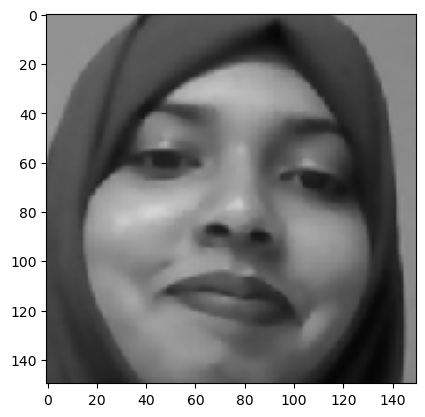

1/1 [==============================] - 0s 36ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


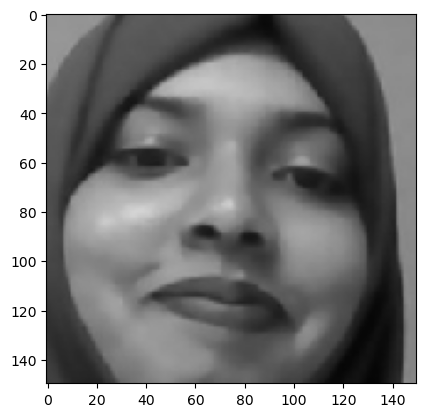

1/1 [==============================] - 0s 27ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


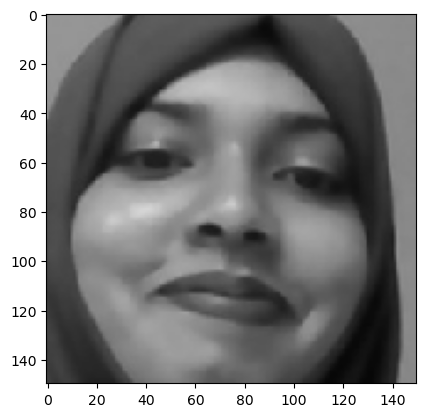

1/1 [==============================] - 0s 14ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


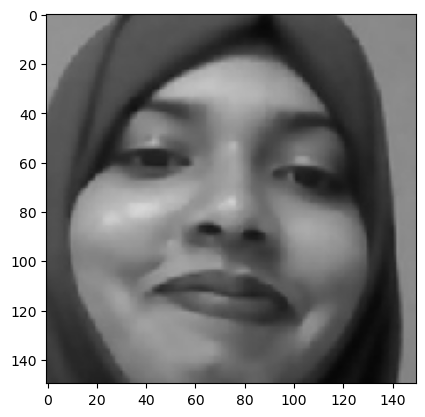

1/1 [==============================] - 0s 34ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


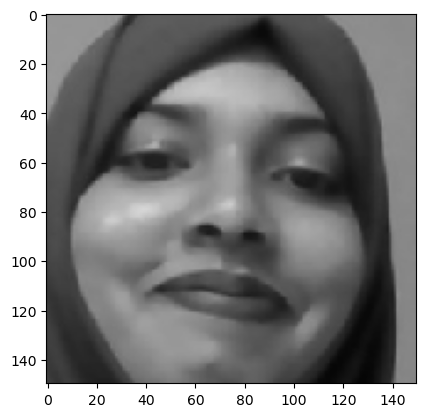

1/1 [==============================] - 0s 16ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]]
Sarfaraz


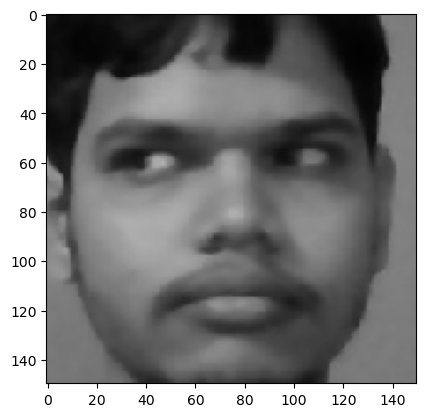

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


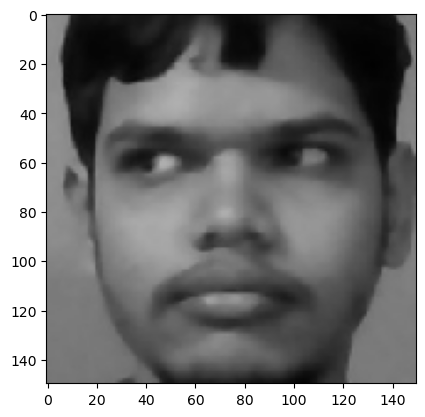

1/1 [==============================] - 0s 24ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


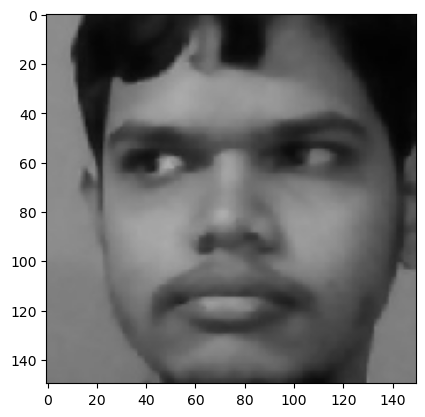

1/1 [==============================] - 0s 29ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


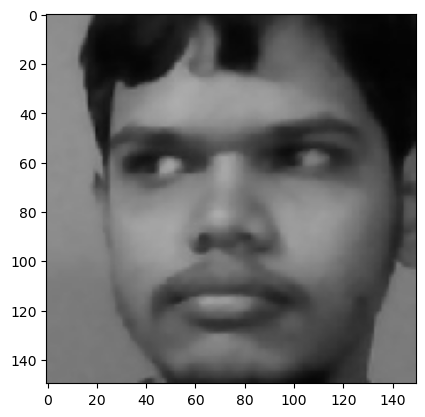

1/1 [==============================] - 0s 26ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


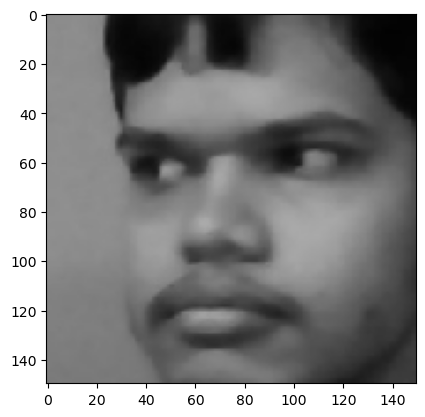

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


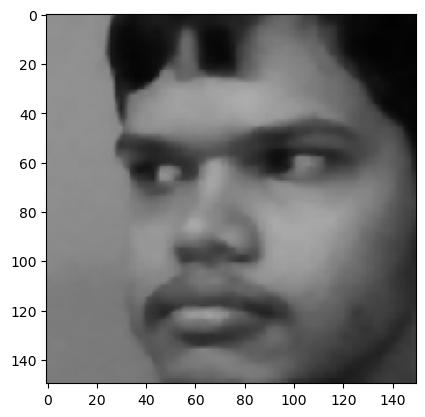

1/1 [==============================] - 0s 35ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


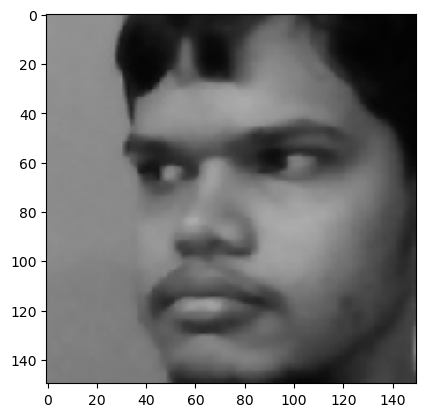

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


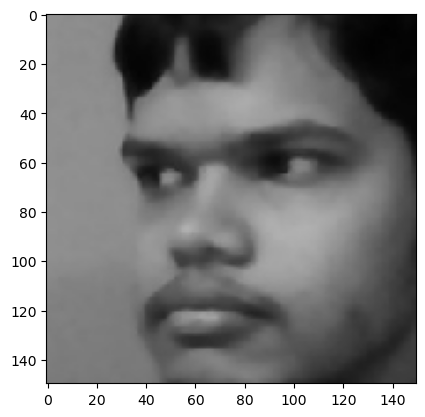

1/1 [==============================] - 0s 22ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


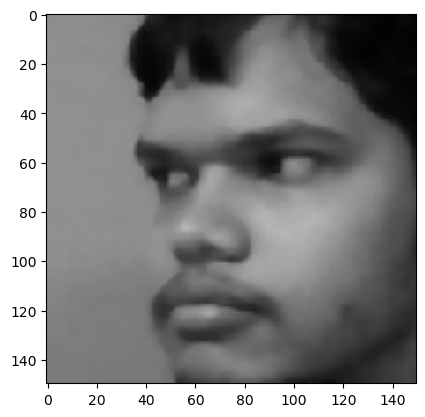

1/1 [==============================] - 0s 24ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


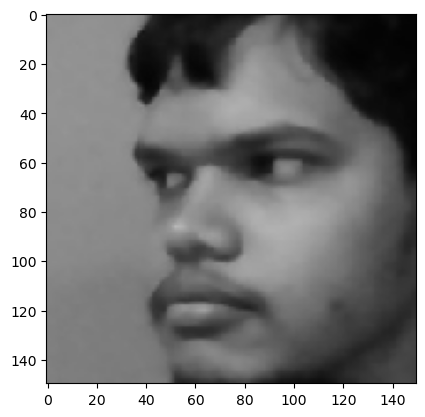

1/1 [==============================] - 0s 29ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


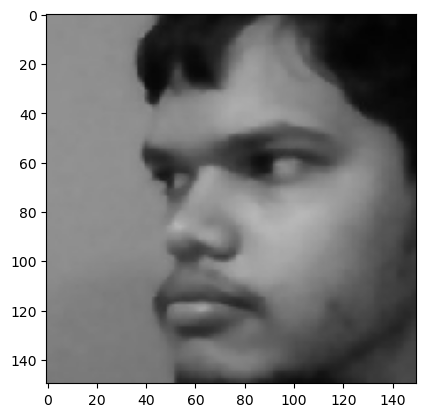

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


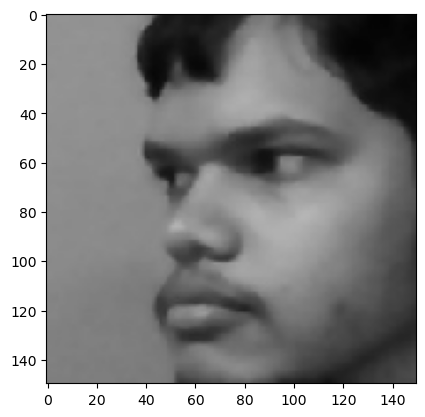

1/1 [==============================] - 0s 33ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


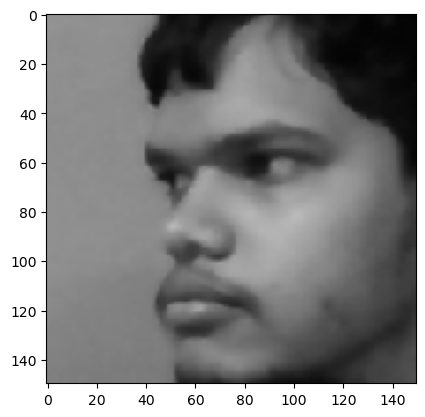

1/1 [==============================] - 0s 23ms/step
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]
Vignesh


In [16]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Load the model
model = tf.keras.models.load_model('train_model.h5')

# Path to the image folder
folder_path = 'test'

# Iterate over the image files in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load and preprocess the image
        img_path = os.path.join(folder_path, filename)
        img = image.load_img(img_path, target_size=(150, 150))
        x = image.img_to_array(img)
        plt.imshow(img)
        plt.show()
        x = np.expand_dims(x, axis=0)
        images = np.vstack([x])

        # Make predictions
        y_pred = model.predict(images)
        print(y_pred)

        # Process the predictions

        if np.array_equal(y_pred, [[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]):
            print("anusha")
        elif np.array_equal(y_pred, [[0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]):
            print("Furqan")    
        elif np.array_equal(y_pred, [[0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]):
            print("Gokul")
        elif np.array_equal(y_pred, [[0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.]]):
            print("Gomini") 
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]]):
            print("Hakim")    
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.]]):
            print("Naveen")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.]]):
            print("Paramesh G")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]]):
            print("Prathyusha")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]]):
            print("Sarfaraz")    
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.]]):
            print("Soujanya")
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]]):
            print("Tahiyya")    
        elif np.array_equal(y_pred, [[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.]]):
            print("Vignesh")
        else:
            print("Data Not Found!!!")
